# 6.UAP: ReChordr 2
## Sarah Shader 

Click on a cell and press _Control Enter_ to run the python code in that cell.

The two code cells below should run without error if you installed all the necessary components.

In [1]:
import numpy as np
import scipy
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline
import IPython.display as ipd
from mido import MidiFile
import re
import os.path
import math

import sys
sys.path.append('..')
from common.gaussian_kernel import *
from rhythm_quantizer import *

This is to process midi files into onsets.

In [2]:
def get_onsets_from_midi(filename):
    # absolute time for each midi event
    counter = 0

    noteon_matcher = re.compile('^note_on')
    onset_times = []
    mid = MidiFile(filename)
    for msg in mid.play():
        counter += msg.time
        if noteon_matcher.match(str(msg)):
            onset_times.append(counter)
    return onset_times

In [3]:
def write_to_file(filename, lines):
    fh = open(filename, 'w')
    s = '\n'
    s = s.join([str(l) for l in lines])
    fh.write(s)
    fh.close()

In [4]:
def read_onsets_from_file(filename):
    if not os.path.exists(filename):
        return []
    fh = open(filename, 'r')
    arr = fh.readlines()
    return [float(a.strip()) for a in arr]

Once we have onsets, functions to process them and play them back.

In [5]:
def collapse_onsets(onsets, threshold):
    collapsed_onsets = []
    cur_onset = onsets[0]
    for i in onsets:
        if i - cur_onset > threshold:
            collapsed_onsets.append(cur_onset)
            cur_onset = i
    return collapsed_onsets

In [6]:
def get_onset_clicks(onsets, sample_rate=22000):
    audio_arr = [0]*(int(onsets[-1] + 1) * int(sample_rate))
    for i in onsets:
        start = int(i * sample_rate)
        for j in range(10):
            audio_arr[start + j] = 1
    return audio_arr

In [7]:
def get_iois(onsets):
    iois = []
    for i in range(len(onsets) - 1):
        iois.append(onsets[i + 1] - onsets[i])
    return iois

In [8]:
onset_times = read_onsets_from_file('rh_onsets.txt')
if len(onset_times) == 0:
    onset_times = get_onsets_from_midi('rh.mid')
    write_to_file('rh_onsets.txt', onset_times)
threshold = .1
collapsed_onsets = collapse_onsets(onset_times, threshold)
clicks = get_onset_clicks(collapsed_onsets)
ipd.Audio(clicks, rate = 22000)     

In [9]:
bach_test_onset_times = read_onsets_from_file('bach_test_onsets.txt')
if len(bach_test_onset_times) == 0:
    bach_test_onset_times = get_onsets_from_midi('bach_test.mid')
    write_to_file('bach_test_onsets.txt', bach_test_onset_times)
threshold = .1
collapsed_onsets = collapse_onsets(onset_times, threshold)
clicks = get_onset_clicks(collapsed_onsets)
ipd.Audio(clicks, rate = 22000)

Algorithm:

In [10]:
iois = get_iois(collapsed_onsets)
# positions are all between 0 and 1 in 4/4
positions = [0, .125, .25, .375, .5, .625, .75, .875]

# maybe worth making these matrices instead
# function for initial probability distribution (takes in a measure position, returns a probability)
def initial(p):
    return .125
# function for transition probability from measure position p1 to p2
def transition(p1, p2):
    return .125

r = RhythmQuantizer(
        positions,
        initial, 
        transition, 
        1.6, # tempo_mean, measured in secs per measure 
        .2, # tempo_variance, 
        .1, # tempo_change_variance, 
        .1, # tempo_noise_variance,
        0, # tempo_min,
        2.4) # tempo_max))
res = r.quantize(iois[0:100])
print res

[0.875, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0, 0.125, 0.375, 0.375, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.375, 0.75, 0.875, 0.125, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.5, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.75, 0.875, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 0, 0.125, 0.5, 0.625, 0.875, 0.25, 0.375, 0.625, 0.75, 0.875, 0, 0.125, 0.25, 0.375, 0.875, 0.25, 0.375, 0.5, 0.625, 0.75, 0.875, 0.625, 0.75, 0.5, 0.625, 0.375, 0.5, 0.25, 0.375, 0.125, 0.25, 0, 0.125, 0.875, 0]


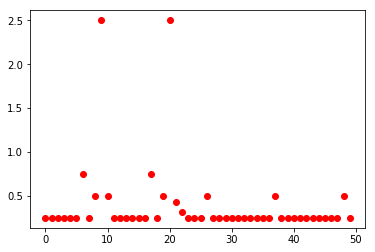

In [11]:
# real data
iois = get_iois(collapsed_onsets)
plt.plot(iois[0:50], 'ro')

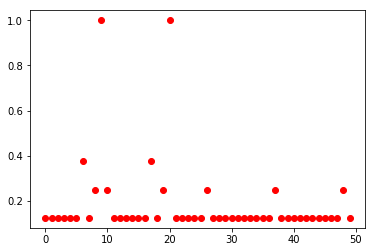

In [12]:
def get_lengths(res):
    lengths = []
    for i in range(len(res) - 1):
        lengths.append(r._get_note_length(res[i], res[i + 1]))
    return lengths

# quantized rhythms
o = get_lengths(res)
plt.plot(o[0:50], 'ro')